# The battle of neighborhoods

In this notebook I explore if there is any link between:
- the clustered neighborhoods of Paris, and
- the number and price of Airbnb listings

Importing/installing necessary libraries

In [64]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json
#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim
import requests 
from pandas.io.json import json_normalize
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
#!conda install -c conda-forge folium=0.5.0 --yes
import folium
import matplotlib.pyplot as plt 
from IPython.display import display, HTML
import yaml
import time
#!conda install -c conda-forge shapely --yes
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
print('Libraries imported.')

Libraries imported.


## Cluster Paris' neighborhoods

Load Paris' neighborhoods from opendata.paris.fr

In [65]:
url = 'https://opendata.paris.fr/explore/dataset/quartier_paris/download/?format=csv&timezone=Europe/Berlin&lang=fr&use_labels_for_header=true&csv_separator=%3B'
df = pd.read_csv(url, sep = ';')

In [66]:
df.head()

,N_SQ_QU,C_QU,C_QUINSEE,L_QU,C_AR,N_SQ_AR,PERIMETRE,SURFACE,Geometry X Y,Geometry
0,750000009,9,7510301,Arts-et-Métiers,3,750000003,2482.460453,318087.740454,"48.8664702895,2.35708313106","{""type"": ""Polygon"", ""coordinates"": [[[2.360209..."
1,750000011,11,7510303,Archives,3,750000003,2534.100042,367728.386867,"48.8591924127,2.36320505733","{""type"": ""Polygon"", ""coordinates"": [[[2.368479..."
2,750000030,30,7510802,Faubourg-du-Roule,8,750000008,3773.673073,796589.051651,"48.8741355756,2.30411880972","{""type"": ""Polygon"", ""coordinates"": [[[2.311968..."
3,750000007,7,7510203,Mail,2,750000002,2179.153605,278142.585084,"48.8680083374,2.34469912743","{""type"": ""Polygon"", ""coordinates"": [[[2.346838..."
4,750000008,8,7510204,Bonne-Nouvelle,2,750000002,2233.976030,281448.206577,"48.8671501183,2.35008019041","{""type"": ""Polygon"", ""coordinates"": [[[2.351518..."


The description of the columns can be found here:
https://opendata.paris.fr/api/datasets/1.0/quartier_paris/attachments/quartier_pdf/

Removing columns not relevant for the analysis

In [67]:
df.drop(['N_SQ_QU', 
         'C_QU', 
         'C_QUINSEE',
         'N_SQ_AR', 
         'PERIMETRE',
         'SURFACE'], axis=1, inplace=True)
df.head()

,L_QU,C_AR,Geometry X Y,Geometry
0,Arts-et-Métiers,3,"48.8664702895,2.35708313106","{""type"": ""Polygon"", ""coordinates"": [[[2.360209..."
1,Archives,3,"48.8591924127,2.36320505733","{""type"": ""Polygon"", ""coordinates"": [[[2.368479..."
2,Faubourg-du-Roule,8,"48.8741355756,2.30411880972","{""type"": ""Polygon"", ""coordinates"": [[[2.311968..."
3,Mail,2,"48.8680083374,2.34469912743","{""type"": ""Polygon"", ""coordinates"": [[[2.346838..."
4,Bonne-Nouvelle,2,"48.8671501183,2.35008019041","{""type"": ""Polygon"", ""coordinates"": [[[2.351518..."


Choosing meaningful names for the columns

In [68]:
df.rename(columns={'L_QU': 'Neighborhood',
                   'C_AR': 'Borough',
                  'Geometry X Y': 'Latitude - Longitude'}, inplace=True)
df.head()

,Neighborhood,Borough,Latitude - Longitude,Geometry
0,Arts-et-Métiers,3,"48.8664702895,2.35708313106","{""type"": ""Polygon"", ""coordinates"": [[[2.360209..."
1,Archives,3,"48.8591924127,2.36320505733","{""type"": ""Polygon"", ""coordinates"": [[[2.368479..."
2,Faubourg-du-Roule,8,"48.8741355756,2.30411880972","{""type"": ""Polygon"", ""coordinates"": [[[2.311968..."
3,Mail,2,"48.8680083374,2.34469912743","{""type"": ""Polygon"", ""coordinates"": [[[2.346838..."
4,Bonne-Nouvelle,2,"48.8671501183,2.35008019041","{""type"": ""Polygon"", ""coordinates"": [[[2.351518..."


Reordering the columns to start with boroughs

In [69]:
neighborhoods = df[['Borough', 'Neighborhood', 'Latitude - Longitude', 'Geometry']]
neighborhoods.head()

,Borough,Neighborhood,Latitude - Longitude,Geometry
0,3,Arts-et-Métiers,"48.8664702895,2.35708313106","{""type"": ""Polygon"", ""coordinates"": [[[2.360209..."
1,3,Archives,"48.8591924127,2.36320505733","{""type"": ""Polygon"", ""coordinates"": [[[2.368479..."
2,8,Faubourg-du-Roule,"48.8741355756,2.30411880972","{""type"": ""Polygon"", ""coordinates"": [[[2.311968..."
3,2,Mail,"48.8680083374,2.34469912743","{""type"": ""Polygon"", ""coordinates"": [[[2.346838..."
4,2,Bonne-Nouvelle,"48.8671501183,2.35008019041","{""type"": ""Polygon"", ""coordinates"": [[[2.351518..."


In [70]:
text = """Paris has {} boroughs (<a href="https://en.wikipedia.org/wiki/Arrondissements_of_Paris">Arrondissements</a>) 
        and {} neighborhoods (<a href="https://en.wikipedia.org/wiki/Quarters_of_Paris">Quartiers</a>). 
        Each Arrondissement has 4 Quartiers.""".format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
html = HTML(text)
display(html)

Plotting the neighborhoods on a map

Get the coordinates of Paris

In [71]:
address = 'Paris, France'

geolocator = Nominatim(user_agent="paris_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of {} are {}, {}.'.format(address, latitude, longitude))

The geograpical coordinate of Paris, France are 48.8566969, 2.3514616.


Because the coordinates in the dataset start with longitude, I use this function to reverse them

In [72]:
def reverse_coordinates(coordinates):
    reversed_coordinates = []
    for i in coordinates:
        reversed_coordinates.append(list(reversed(i)))
    return reversed_coordinates

Unlike what we did in the course, I use polygons instead of markers, because they are more suitable for drawing areas

In [73]:
map_paris = folium.Map(location=[latitude, longitude], zoom_start=12)
for polygon, borough, neighborhood in zip(neighborhoods['Geometry'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    coordinates = json.loads(polygon)
    folium.features.PolygonMarker(
        locations=reverse_coordinates(coordinates["coordinates"][0]), 
        popup=label,
        color='#000000', 
        fill_color='blue',
        fill_opacity=0.3,
        weight=1.5).add_to(map_paris)
map_paris

Embedding the image in case it is not rendered in the web:

![](https://raw.githubusercontent.com/dsait/Coursera_Capstone/master/paris-neighborhoods.png)

Now let's get nearby venues for every neighborhood

Loading Foursquare API credentials from yaml configuration file

In [74]:
import yaml
with open("foursquare-config.yml", 'r') as ymlfile:
    cfg = yaml.safe_load(ymlfile)
CLIENT_ID = cfg["api_creds"]["CLIENT_ID"] 
CLIENT_SECRET = cfg["api_creds"]["CLIENT_SECRET"] 
VERSION = '20180605' 

Defining the function that gets nearby venues for every neighborhood.<br>
The one we used in the course does not handle exceptions when the call to Foursquare fails, so I added a retry after 10 seconds to resume after failing for the remaining neighborhoods

In [75]:
LIMIT = 100
radius = 500 # define radius
def getNearbyVenues(names, latitudes_longitudes, radius=500):    
    venues_list=[]
    for name, lat_lng in zip(names, latitudes_longitudes):
        a = lat_lng.split(",")
        lat = a[0]
        lng = a[1]
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
       
        successful = False
        while not successful:
            try:
                results = requests.get(url).json()["response"]['groups'][0]['items']
                successful = True
            except:
                time.sleep(10)
        
        venues_list.append([(
            name, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    return(nearby_venues)

Getting the venues and storing them in a local file, to avoid calling foursquare every time the notebook is run and not exceed the API rate limit

In [76]:
#paris_venues = getNearbyVenues(names=neighborhoods['Neighborhood'], latitudes_longitudes=neighborhoods['Latitude - Longitude'])
#paris_venues.to_csv('paris_venues.csv', index=False, encoding='utf-8')

Load the venues from the file

In [77]:
paris_venues = pd.read_csv('paris_venues.csv')
paris_venues.head()

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Notre-Dame-des-Champs,Legend Hotel,48.845316,2.325507,Hotel
1,Notre-Dame-des-Champs,Sadaharu Aoki | 青木定治,48.848013,2.330366,Dessert Shop
2,Notre-Dame-des-Champs,Bagels & Brownies,48.846537,2.327329,Bagel Shop
3,Notre-Dame-des-Champs,Gilles Verot,48.847118,2.326819,Deli / Bodega
4,Notre-Dame-des-Champs,Hôtel Le Littré,48.845458,2.324139,Hotel


In [78]:
paris_venues.shape

(5066, 5)

In [79]:
print('There are {} unique categories.'.format(len(paris_venues['Venue Category'].unique())))

There are 293 unique categories.


Hot encoding on the venue category column

In [80]:
paris_onehot = pd.get_dummies(paris_venues[['Venue Category']], prefix="", prefix_sep="")
paris_onehot['Neighborhood'] = paris_venues['Neighborhood'] 
fixed_columns = [paris_onehot.columns[-1]] + list(paris_onehot.columns[:-1])
paris_onehot = paris_onehot[fixed_columns]
paris_onehot.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,Alsatian Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Automotive Shop,Auvergne Restaurant,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Basketball Court,Basque Restaurant,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bistro,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Breton Restaurant,Brewery,Bridge,Bubble Tea Shop,Burger Joint,Burgundian Restaurant,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caucasian Restaurant,Cemetery,Ch'ti Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Corsican Restaurant,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cultural Center,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Dive Bar,Doner Restaurant,Donut Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hawaiian Restaurant,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Jiangxi Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Lawyer,Leather Goods Store,Lebanese Restaurant,Lingerie Store,Liquor Store,Locksmith,Lounge,Lyonese Bouchon,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Multiplex,Museum,Music Store,Music Venue,New American Restaurant,Newsstand,Nightclub,Noodle House,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Outdoor Sculpture,Outdoors & Recreation,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Peruvian Restaurant,Pet Café,Pharmacy,Pier,Pizza Place,Planetarium,Platform,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Provençal Restaurant,Pub,Racecourse,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Resort,Restaurant,Rock Club,Roof Deck,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Savoyard Restaurant,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shanxi Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Southwestern French Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Syrian Restaurant,Szechuan Restaurant,Taco Place,Tailor Shop,Taiwanese Restaurant,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,

Define a function that returns the most common venues per neighborhood

In [81]:
paris_grouped = paris_onehot.groupby('Neighborhood').mean().reset_index()

In [82]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [83]:
num_top_venues = 10
indicators = ['st', 'nd', 'rd']
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = paris_grouped['Neighborhood']
for ind in np.arange(paris_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(paris_grouped.iloc[ind, :], num_top_venues)
neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Amérique,French Restaurant,Supermarket,Bus Stop,Pool,Health Food Store,Bistro,Café,Bed & Breakfast,Bakery,Park
1,Archives,French Restaurant,Hotel,Italian Restaurant,Art Gallery,Japanese Restaurant,Coffee Shop,Bar,Cocktail Bar,Clothing Store,Bistro
2,Arsenal,French Restaurant,Hotel,Gastropub,Plaza,Seafood Restaurant,Italian Restaurant,Park,Cocktail Bar,Museum,Boat or Ferry
3,Arts-et-Métiers,French Restaurant,Cocktail Bar,Hotel,Wine Bar,Italian Restaurant,Restaurant,Bar,Japanese Restaurant,Moroccan Restaurant,Chinese Restaurant
4,Auteuil,Tennis Court,Stadium,Sporting Goods Shop,Racecourse,Botanical Garden,French Restaurant,Office,Museum,Outdoors & Recreation,Garden


Cluster the neighborhoods based on nearby venues categories

In [84]:
kclusters = 5
paris_grouped_clustering = paris_grouped.drop('Neighborhood', 1)
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(paris_grouped_clustering)
kmeans.labels_[0:10] 

array([3, 2, 1, 2, 2, 1, 3, 2, 2, 2], dtype=int32)

Add the clusters labels to the data frame

In [85]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
paris_merged = neighborhoods
paris_merged = paris_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
paris_merged.head()

,Borough,Neighborhood,Latitude - Longitude,Geometry,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,3,Arts-et-Métiers,"48.8664702895,2.35708313106","{""type"": ""Polygon"", ""coordinates"": [[[2.360209...",2,French Restaurant,Cocktail Bar,Hotel,Wine Bar,Italian Restaurant,Restaurant,Bar,Japanese Restaurant,Moroccan Restaurant,Chinese Restaurant
1,3,Archives,"48.8591924127,2.36320505733","{""type"": ""Polygon"", ""coordinates"": [[[2.368479...",2,French Restaurant,Hotel,Italian Restaurant,Art Gallery,Japanese Restaurant,Coffee Shop,Bar,Cocktail Bar,Clothing Store,Bistro
2,8,Faubourg-du-Roule,"48.8741355756,2.30411880972","{""type"": ""Polygon"", ""coordinates"": [[[2.311968...",0,Hotel,French Restaurant,Jewelry Store,Italian Restaurant,Café,Cosmetics Shop,Pastry Shop,Tailor Shop,Men's Store,Asian Restaurant
3,2,Mail,"48.8680083374,2.34469912743","{""type"": ""Polygon"", ""coordinates"": [[[2.346838...",2,French Restaurant,Cocktail Bar,Wine Bar,Bakery,Coffee Shop,Bar,Creperie,Hotel,Pedestrian Plaza,Boutique
4,2,Bonne-Nouvelle,"48.8671501183,2.35008019041","{""type"": ""Polygon"", ""coordinates"": [[[2.351518...",2,French Restaurant,Cocktail Bar,Wine Bar,Bakery,Hotel,Italian Restaurant,Restaurant,Bar,Japanese Restaurant,Café


In [86]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
rainbow = ['#d50000','#6200EA','#3E2723','#00C853','#FFD600']
for polygon, borough, neighborhood, cluster in zip(paris_merged['Geometry'], paris_merged['Borough'], paris_merged['Neighborhood'], paris_merged['Cluster Labels']):
    label = folium.Popup(str(neighborhood) + ', Cluster : ' + str(cluster), parse_html=True)
    coordinates = json.loads(polygon)
    folium.features.PolygonMarker(
        locations=reverse_coordinates(coordinates["coordinates"][0]), 
        popup=label,
        color='#000000', 
        fill_color=rainbow[cluster-1],
        fill_opacity=0.3,
        weight=1.5).add_to(map_clusters)
map_clusters

Embedding the image in case it is not rendered in the web:

![](https://raw.githubusercontent.com/dsait/Coursera_Capstone/master/paris-clustered-neighborhoods.png)

Let's check how many neighborhoods are located in each cluster

In [87]:
paris_merged.groupby(['Cluster Labels']).size()

Cluster Labels
0    17
1    23
2    34
3     5
4     1
dtype: int64

## Airbnb listings in Paris

This is the source of the data:<br>
http://data.insideairbnb.com/france/ile-de-france/paris/2020-04-15/visualisations/listings.csv <br>
Because the file is large (8 MB), I use a local copy

In [88]:
listings_paris = pd.read_csv('listings_paris.csv')
listings_paris.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,3109,zen and calm,3631,Anne,NaN,Observatoire,48.83349,2.31852,Entire home/apt,60,2,9,2019-10-24,0.22,1,365
1,5396,Explore the heart of old Paris,7903,Borzou,NaN,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,115,1,220,2020-03-22,1.67,1,86
2,7397,MARAIS - 2ROOMS APT - 2/4 PEOPLE,2626,Franck,NaN,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,119,10,268,2020-02-26,2.44,2,282
3,7964,Large & sunny flat with balcony !,22155,Anaïs,NaN,Opéra,48.87417,2.34245,Entire home/apt,130,6,6,2015-09-14,0.05,1,308
4,9359,"Cozy, Central Paris: WALK or VELIB EVERYWHERE !",28422,Bernadette,NaN,Louvre,48.85899,2.34735,Entire home/apt,75,180,0,NaN,NaN,1,50


Drop columns not relevant for the analysis

In [89]:
listings_paris.drop(['id', 
         'name', 
         'host_id',
         'host_name', 
         'neighbourhood_group',
         'minimum_nights',
        'last_review',
        'reviews_per_month',
        'calculated_host_listings_count',
        'availability_365'], axis=1, inplace=True)
listings_paris.head()

,neighbourhood,latitude,longitude,room_type,price,number_of_reviews
0,Observatoire,48.83349,2.31852,Entire home/apt,60,9
1,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,115,220
2,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,119,268
3,Opéra,48.87417,2.34245,Entire home/apt,130,6
4,Louvre,48.85899,2.34735,Entire home/apt,75,0


In [90]:
listings_paris.shape

(59322, 6)

There are nearly 60K records.<br>
It takes a lot of time to process all the data. <br>
I take only listings of type 'Entire home/apt' and that have 50+ reviews.

In [91]:
listings_paris = listings_paris[listings_paris.room_type == 'Entire home/apt']
listings_paris = listings_paris[listings_paris.number_of_reviews > 50]
listings_paris.shape

(5349, 6)

In [92]:
listings_paris.head()

,neighbourhood,latitude,longitude,room_type,price,number_of_reviews
1,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,115,220
2,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,119,268
8,Panthéon,48.84670,2.35095,Entire home/apt,75,355
11,Gobelins,48.82405,2.36828,Entire home/apt,120,85
12,Popincourt,48.86578,2.37705,Entire home/apt,79,334


Add a price category:
- High : if price above the median
- Low : if price below the median

In [93]:
criteria = [listings_paris['price'].between(listings_paris['price'].min(), listings_paris['price'].median()),
            listings_paris['price'].between(listings_paris['price'].median(), listings_paris['price'].max())]
values = ['Low', 'High']

listings_paris['price_category'] = np.select(criteria, values, 0)
listings_paris.head()

,neighbourhood,latitude,longitude,room_type,price,number_of_reviews,price_category
1,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,115,220,High
2,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,119,268,High
8,Panthéon,48.84670,2.35095,Entire home/apt,75,355,Low
11,Gobelins,48.82405,2.36828,Entire home/apt,120,85,High
12,Popincourt,48.86578,2.37705,Entire home/apt,79,334,Low


The dataset of Airbnb contains only the borough, which it calls neighborhood.<br>
Here I add the administrative neighborhood and the cluster to the listings

In [94]:
for index, row in listings_paris.iterrows():
    point = Point(row['longitude'], row['latitude'])
    for index1, row1 in paris_merged.iterrows():        
        polygon = Polygon(json.loads(row1['Geometry'])["coordinates"][0])
        if polygon.contains(point): 
            listings_paris.loc[index, 'administrative_neighborhood'] = row1['Neighborhood']
            listings_paris.loc[index, 'arrondissement'] = row1['Borough']
            listings_paris.loc[index, 'cluster'] = row1['Cluster Labels']
            break
listings_paris.head()

,neighbourhood,latitude,longitude,room_type,price,number_of_reviews,price_category,administrative_neighborhood,arrondissement,cluster
1,Hôtel-de-Ville,48.85100,2.35869,Entire home/apt,115,220,High,Notre-Dame,4.0,1.0
2,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,119,268,High,Saint-Merri,4.0,1.0
8,Panthéon,48.84670,2.35095,Entire home/apt,75,355,Low,Saint-Victor,5.0,1.0
11,Gobelins,48.82405,2.36828,Entire home/apt,120,85,High,Gare,13.0,2.0
12,Popincourt,48.86578,2.37705,Entire home/apt,79,334,Low,Folie-Méricourt,11.0,2.0


In [95]:
for i, (lat, lng, price, reviews, price_category) in enumerate(zip(listings_paris['latitude'], listings_paris['longitude'], listings_paris['price'], listings_paris['number_of_reviews'], listings_paris['price_category'])):
    label = folium.Popup('Price : '+str(price) + ', Reviews : ' + str(reviews), parse_html=True)
    if price_category=='High':
        color = '#000000'
    else:
        color = '#FFFFFF'
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        parse_html=False).add_to(map_paris)
map_paris

Embedding the image in case it is not rendered in the web:

![](https://raw.githubusercontent.com/dsait/Coursera_Capstone/master/clustered-listings-map.png)

Group the listings by clusters and price category to see if there is any link ...

In [96]:
listings_clustered = listings_paris.groupby(['cluster', 'price_category'])['cluster'].count().unstack('price_category').fillna(0)

listings_clustered.head()

price_category,High,Low
cluster,,
0.0,446,427
1.0,751,805
2.0,1250,1475
3.0,43,104
4.0,7,41


... and plot them

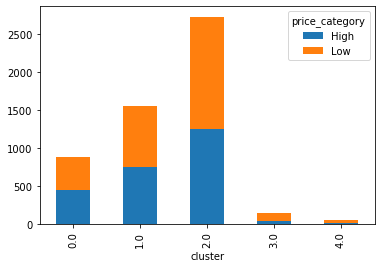

In [97]:
listings_clustered.plot(kind='bar', stacked=True)

Clusters 3 & 4 host very few listings, which makes sense, because they are peripheral and have very few interesting venues.

Clusters 0, 1 and 2 host increasing number of listings, cluster 2 being the top, but the prices are almost evenly distributed between High and Low

Conclusion:
- The number of Airbnb listings depend significantly on neighborhood clusters.
- The prices of Airbnb listings do not depend significantly on neighborhood clusters. 

It is even more apparent when it is plotted on a map:
- the black dots are high price listings
- the white dots are low price listings

Both of them are evenly scattered across clusters:

In [98]:
for i, (lat, lng, price, reviews, price_category) in enumerate(zip(listings_paris['latitude'], listings_paris['longitude'], listings_paris['price'], listings_paris['number_of_reviews'], listings_paris['price_category'])):
    label = folium.Popup('Price : '+str(price) + ', Reviews : ' + str(reviews), parse_html=True)
    if price_category=='High':
        color = '#000000'
    else:
        color = '#FFFFFF'
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        parse_html=False).add_to(map_clusters)
map_clusters

Embedding the image in case it is not rendered in the web:

![](https://raw.githubusercontent.com/dsait/Coursera_Capstone/master/clustered-listings-on-map.png)

Because the radius used to search is 500 meters, there will be many venues that belong to more than one neighborhood

Let's find some duplicates

In [99]:
venues = paris_venues["Venue"]
paris_venues[venues.isin(venues[venues.duplicated()])].head()

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category
1,Notre-Dame-des-Champs,Sadaharu Aoki | 青木定治,48.848013,2.330366,Dessert Shop
9,Notre-Dame-des-Champs,Les Bistronautes,48.846500,2.330793,French Restaurant
11,Notre-Dame-des-Champs,Amorino,48.845255,2.325442,Ice Cream Shop
13,Notre-Dame-des-Champs,Thevenin,48.846781,2.327252,Bakery
14,Notre-Dame-des-Champs,Le Petit Verdot,48.848050,2.323412,French Restaurant


In [100]:
paris_venues.loc[paris_venues['Venue'] == "Les Bistronautes"]

,Neighborhood,Venue,Venue Latitude,Venue Longitude,Venue Category
9,Notre-Dame-des-Champs,Les Bistronautes,48.8465,2.330793,French Restaurant
4051,Odéon,Les Bistronautes,48.8465,2.330793,French Restaurant
